<a href="https://colab.research.google.com/github/CarlosCordova2023/Red_Neuronal_convolucionales_PYTHON/blob/main/Red_Neuronal_convolucionales.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
import tensorflow as tf
import tensorflow_datasets as tfds


In [3]:
datos, metadatos=tfds.load("mnist", as_supervised=True, with_info=True)

Dl Completed...:   0%|          | 0/5 [00:00<?, ? file/s]

Dataset mnist downloaded and prepared to /root/tensorflow_datasets/mnist/3.0.1. Subsequent calls will reuse this data.


In [4]:
metadatos

tfds.core.DatasetInfo(
    name='mnist',
    full_name='mnist/3.0.1',
    description="""
    The MNIST database of handwritten digits.
    """,
    homepage='http://yann.lecun.com/exdb/mnist/',
    data_dir='/root/tensorflow_datasets/mnist/incomplete.NNSZX8_3.0.1/',
    file_format=tfrecord,
    download_size=11.06 MiB,
    dataset_size=21.00 MiB,
    features=FeaturesDict({
        'image': Image(shape=(28, 28, 1), dtype=uint8),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=10),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'test': <SplitInfo num_examples=10000, num_shards=1>,
        'train': <SplitInfo num_examples=60000, num_shards=1>,
    },
    citation="""@article{lecun2010mnist,
      title={MNIST handwritten digit database},
      author={LeCun, Yann and Cortes, Corinna and Burges, CJ},
      journal={ATT Labs [Online]. Available: http://yann.lecun.com/exdb/mnist},
      volume={2},
      year={2010}
    }""

In [5]:
datos_entrenamiento=datos["train"]
datos_pruebas=datos["test"]

In [6]:
metadatos.features["label"].names

['0', '1', '2', '3', '4', '5', '6', '7', '8', '9']

In [7]:
nombres_clases=metadatos.features["label"].names

In [8]:
# Normalización
# 0-255 1 byte
# Transformar 0-255 0-1 (0=0, 255=1, 127=.5)

#Normalizar datos

def normalizar(imagenes, etiquetas):
  imagenes=tf.cast(imagenes, tf.float32)
  imagenes=imagenes/255
  return imagenes, etiquetas

datos_entrenamiento=datos_entrenamiento.map(normalizar)
datos_pruebas=datos_pruebas.map(normalizar)

#Agregar en caché

datos_entrenamiento=datos_entrenamiento.cache()
datos_pruebas=datos_pruebas.cache()

In [9]:
datos_entrenamiento.take(1)

<_TakeDataset element_spec=(TensorSpec(shape=(28, 28, 1), dtype=tf.float32, name=None), TensorSpec(shape=(), dtype=tf.int64, name=None))>

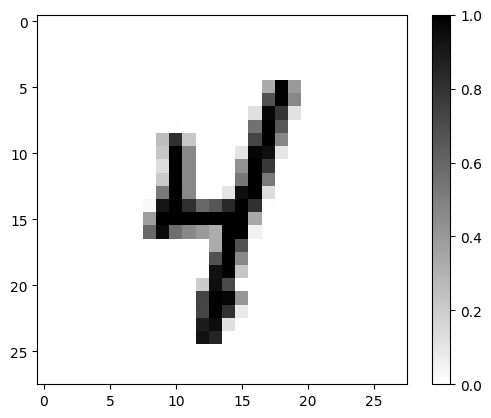

In [10]:
for imagen, etiquetas in datos_entrenamiento.take(1):
  break

import matplotlib.pyplot as plt

#Mostrar en pantalla
plt.figure()
plt.imshow(imagen, cmap=plt.cm.binary)
plt.colorbar()
plt.show()

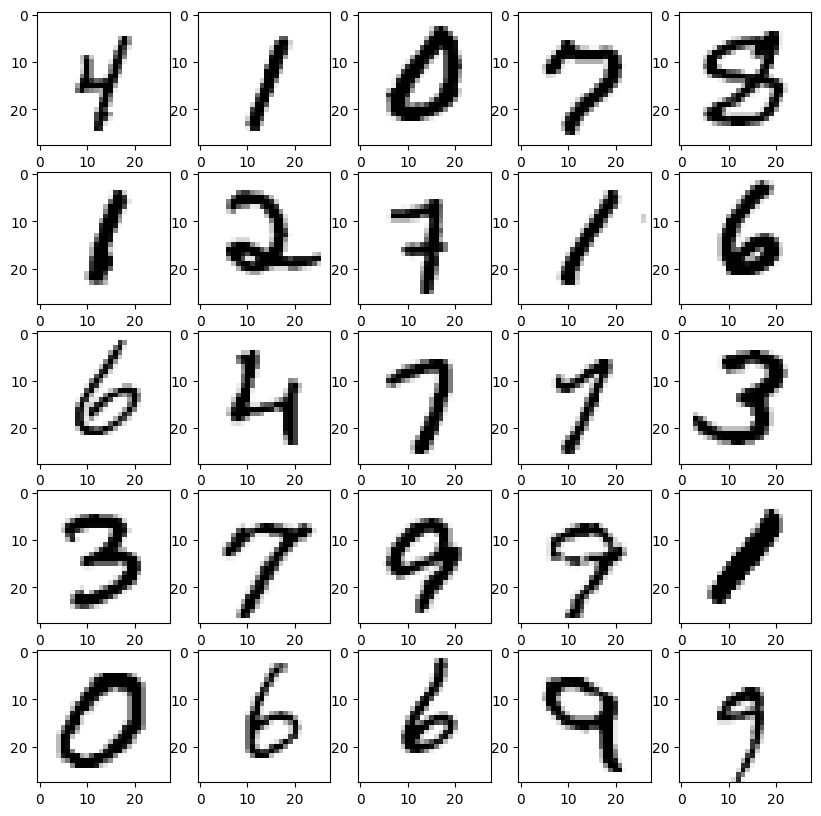

In [11]:
plt.figure(figsize=(10,10))

for i, (imagen, etiquetas) in enumerate(datos_entrenamiento.take(25)):
  #Mostrar en pantalla
  plt.subplot(5,5,i+1)
  plt.imshow(imagen, cmap=plt.cm.binary)

plt.show()

In [12]:
 """modelo=tf.keras.Sequential([
     #782
     tf.keras.layers.Flatten(input_shape=(28,28,1)), #1=blanco y negro

     ### Capa Oculta
     tf.keras.layers.Dense(50,activation=tf.nn.relu),
     tf.keras.layers.Dense(50,activation=tf.nn.relu),

     #Capa salida
     tf.keras.layers.Dense(10,activation=tf.nn.softmax)

 ])"""

 modelo=tf.keras.Sequential([
     tf.keras.layers.Conv2D(32,(3,3),input_shape=(28,28,1), activation="relu"),
     tf.keras.layers.MaxPooling2D(2,2),

     tf.keras.layers.Conv2D(64,(3,3), activation="relu"),
     tf.keras.layers.MaxPooling2D(2,2),

     tf.keras.layers.Flatten(),
     tf.keras.layers.Dense(100,activation="relu"),
     tf.keras.layers.Dense(10,activation="softmax")

 ])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [13]:
modelo.compile(
    optimizer="adam",
    loss=tf.keras.losses.SparseCategoricalCrossentropy(),
    metrics=["accuracy"]
)

In [14]:
TAMANO_LOTE=32

datos_entrenamiento=datos_entrenamiento.repeat().shuffle(60000).batch(TAMANO_LOTE)
datos_pruebas=datos_pruebas.batch(TAMANO_LOTE)

In [15]:
import math
#Entrenar
entrenamiento=modelo.fit(
    datos_entrenamiento, epochs=10,
    steps_per_epoch=math.ceil(60000/TAMANO_LOTE)
)

Epoch 1/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 21s 3ms/step - accuracy: 0.9003 - loss: 0.3108
Epoch 2/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9853 - loss: 0.0484
Epoch 3/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9893 - loss: 0.0356
Epoch 4/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9924 - loss: 0.0233
Epoch 5/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9947 - loss: 0.0158
Epoch 6/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9954 - loss: 0.0137
Epoch 7/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9959 - loss: 0.0116
Epoch 8/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9971 - loss: 0.0098
Epoch 9/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9980 - loss: 0.0066
Epoch 10/10
1875/1875 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.9979 - loss: 0.0071


In [16]:
datos, metadatos=tfds.load("cats_vs_dogs", as_supervised=True, with_info=True)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/23262 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/cats_vs_dogs/incomplete.YR3OGP_4.0.1/cats_vs_dogs-train.tfrecord*...:   0%…

Dataset cats_vs_dogs downloaded and prepared to /root/tensorflow_datasets/cats_vs_dogs/4.0.1. Subsequent calls will reuse this data.


In [17]:
metadatos


tfds.core.DatasetInfo(
    name='cats_vs_dogs',
    full_name='cats_vs_dogs/4.0.1',
    description="""
    A large set of images of cats and dogs. There are 1738 corrupted images that are dropped.
    """,
    homepage='https://www.microsoft.com/en-us/download/details.aspx?id=54765',
    data_dir=PosixGPath('/tmp/tmp10vq84u2tfds'),
    file_format=tfrecord,
    download_size=786.67 MiB,
    dataset_size=1.04 GiB,
    features=FeaturesDict({
        'image': Image(shape=(None, None, 3), dtype=uint8),
        'image/filename': Text(shape=(), dtype=string),
        'label': ClassLabel(shape=(), dtype=int64, num_classes=2),
    }),
    supervised_keys=('image', 'label'),
    disable_shuffling=False,
    splits={
        'train': <SplitInfo num_examples=23262, num_shards=16>,
    },
    citation="""@Inproceedings (Conference){asirra-a-captcha-that-exploits-interest-aligned-manual-image-categorization,
    author = {Elson, Jeremy and Douceur, John (JD) and Howell, Jon and Saul, Jared},
    

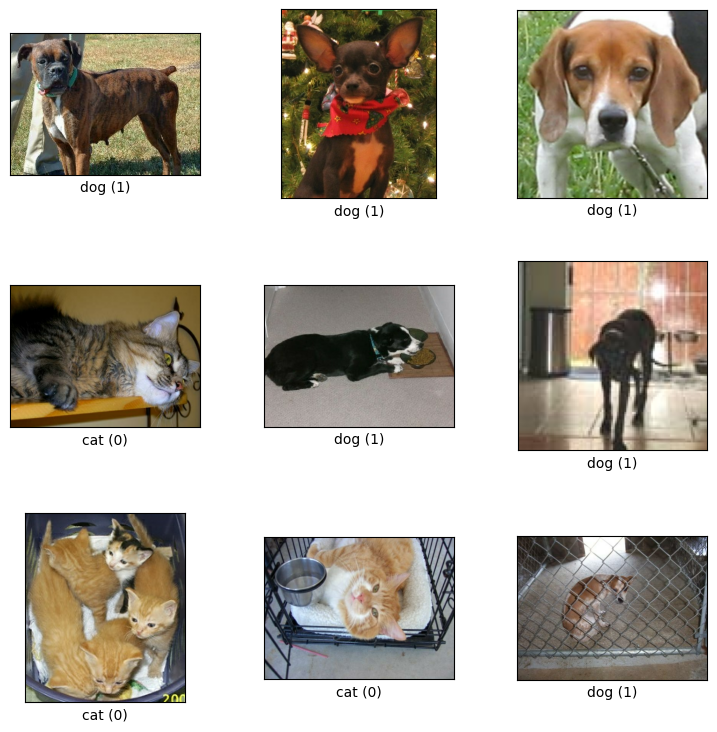

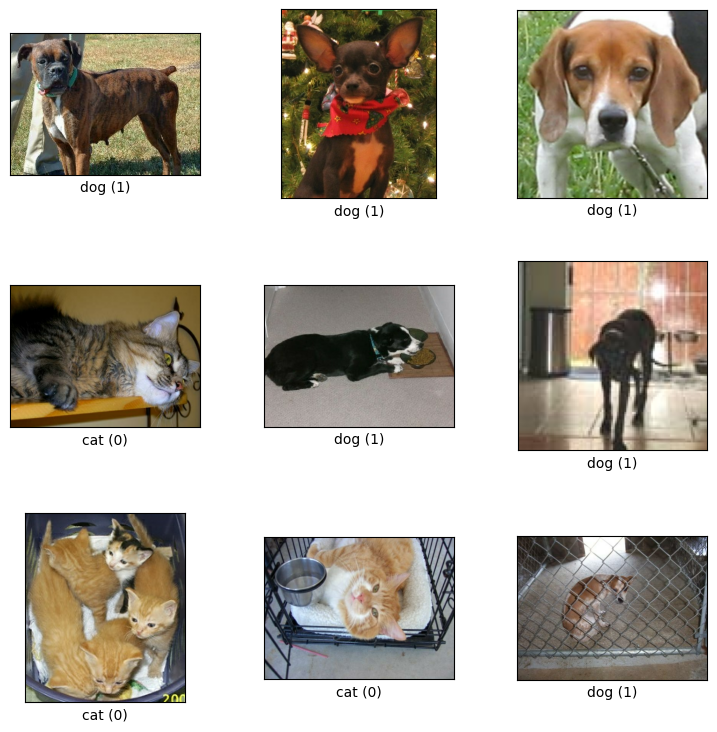

In [18]:
tfds.show_examples(datos["train"], metadatos)

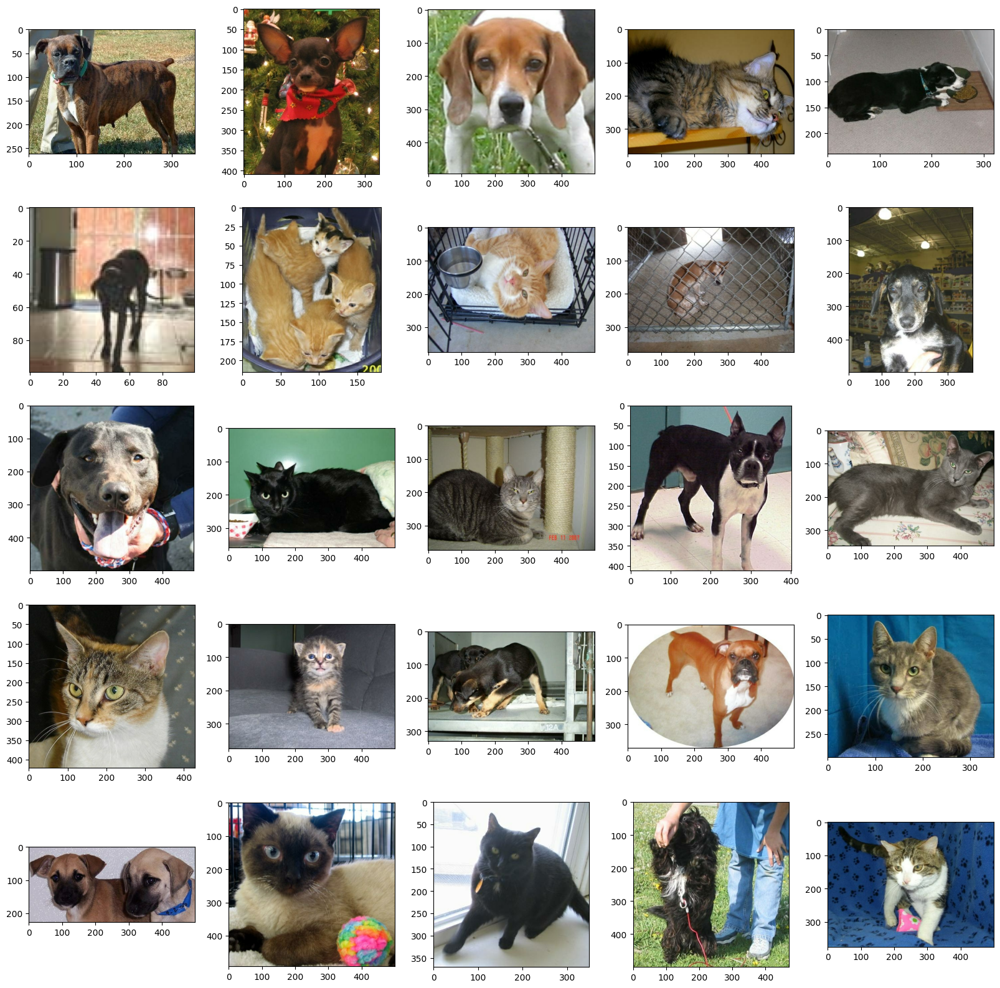

In [19]:
import matplotlib.pyplot as plt
import cv2 #open cv - trabajar y hacer transformaciones de imagenes

plt.figure(figsize=(20,20))

TAMANO_IMG=100

for i, (imagen, etiqueta) in enumerate(datos["train"].take(25)):
  plt.subplot(5,5,i+1)
  plt.imshow(imagen)

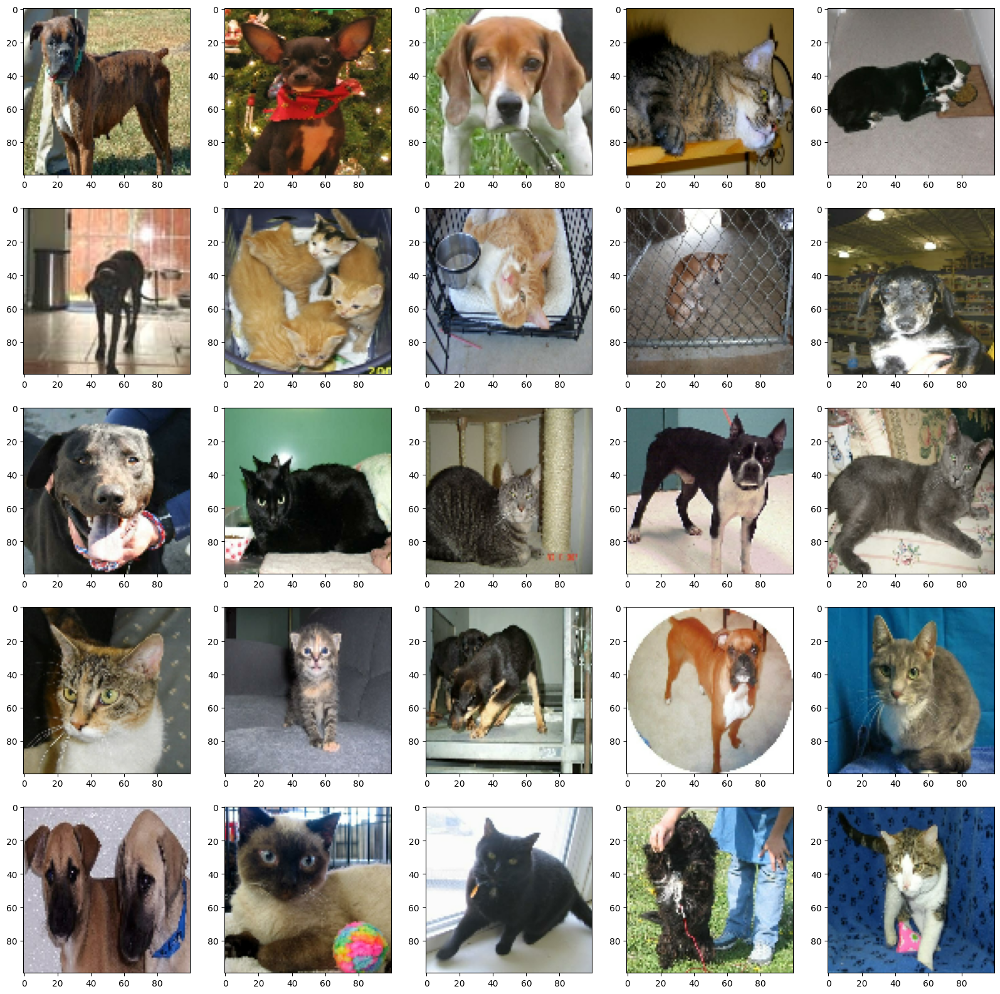

In [20]:
import matplotlib.pyplot as plt
import cv2 #open cv - trabajar y hacer transformaciones de imagenes

plt.figure(figsize=(20,20))

TAMANO_IMG=100

for i, (imagen, etiqueta) in enumerate(datos["train"].take(25)):
  imagen=cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
  plt.subplot(5,5,i+1)
  plt.imshow(imagen)

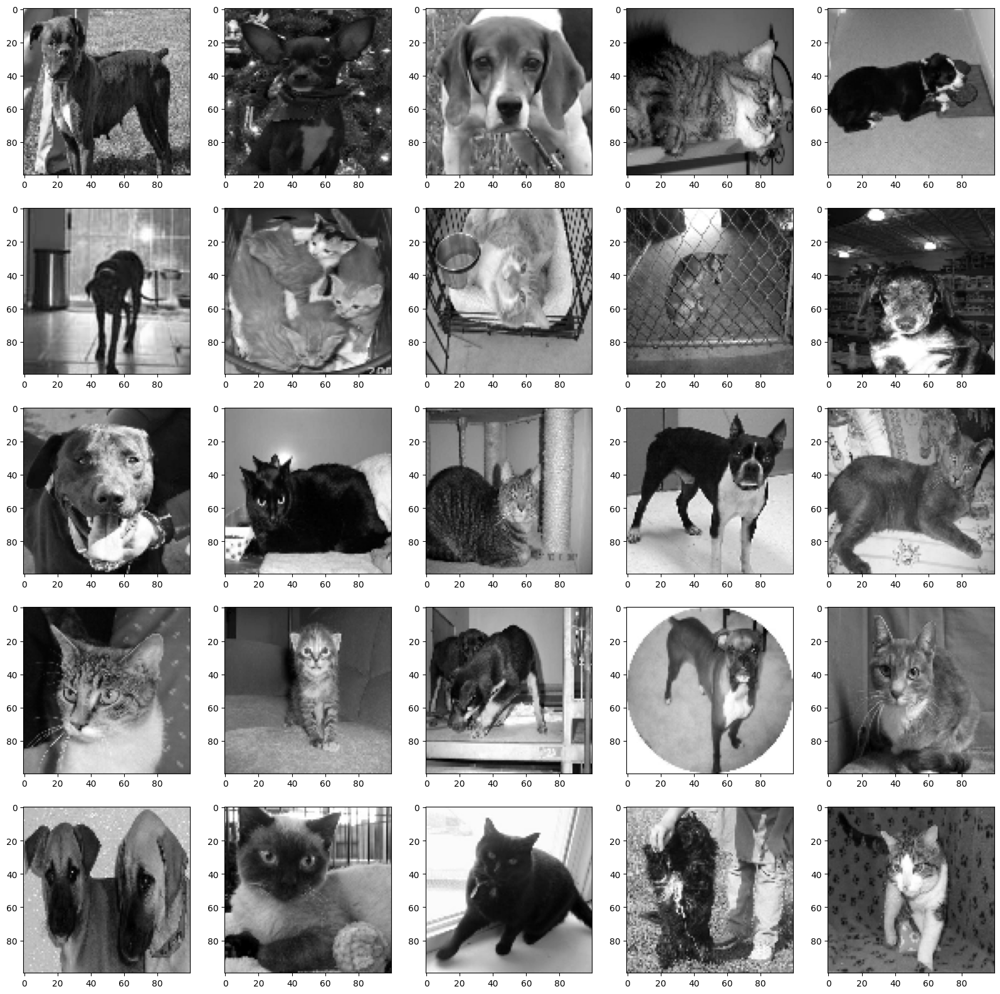

In [21]:
import matplotlib.pyplot as plt
import cv2 #open cv - trabajar y hacer transformaciones de imagenes

plt.figure(figsize=(20,20))

TAMANO_IMG=100

for i, (imagen, etiqueta) in enumerate(datos["train"].take(25)):
  imagen=cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
  imagen=cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  plt.subplot(5,5,i+1)
  plt.imshow(imagen, cmap="gray")

In [22]:
datos_entrenamiento=[]

In [23]:
for i, (imagen, etiqueta) in enumerate(datos["train"]):
  imagen=cv2.resize(imagen.numpy(), (TAMANO_IMG, TAMANO_IMG))
  imagen=cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
  imagen=imagen.reshape(TAMANO_IMG, TAMANO_IMG,1)
  datos_entrenamiento.append([imagen,etiqueta])

In [24]:
datos_entrenamiento[0]

[array([[[249],
         [190],
         [105],
         ...,
         [189],
         [196],
         [143]],
 
        [[232],
         [127],
         [ 88],
         ...,
         [187],
         [180],
         [186]],
 
        [[171],
         [ 87],
         [ 83],
         ...,
         [129],
         [158],
         [166]],
 
        ...,
 
        [[113],
         [173],
         [162],
         ...,
         [143],
         [156],
         [119]],
 
        [[140],
         [152],
         [171],
         ...,
         [ 98],
         [155],
         [154]],
 
        [[ 91],
         [109],
         [167],
         ...,
         [ 46],
         [ 51],
         [ 47]]], dtype=uint8),
 <tf.Tensor: shape=(), dtype=int64, numpy=1>]

In [25]:
#Preparar Variables

X=[]
y=[]

for imagen, etiqueta in datos_entrenamiento:
  X.append(imagen)
  y.append(imagen)


In [26]:
# Normalizar las imágenes

import numpy as np

X=np.array(X).astype(float)/255


In [27]:
X[0]

array([[[0.97647059],
        [0.74509804],
        [0.41176471],
        ...,
        [0.74117647],
        [0.76862745],
        [0.56078431]],

       [[0.90980392],
        [0.49803922],
        [0.34509804],
        ...,
        [0.73333333],
        [0.70588235],
        [0.72941176]],

       [[0.67058824],
        [0.34117647],
        [0.3254902 ],
        ...,
        [0.50588235],
        [0.61960784],
        [0.65098039]],

       ...,

       [[0.44313725],
        [0.67843137],
        [0.63529412],
        ...,
        [0.56078431],
        [0.61176471],
        [0.46666667]],

       [[0.54901961],
        [0.59607843],
        [0.67058824],
        ...,
        [0.38431373],
        [0.60784314],
        [0.60392157]],

       [[0.35686275],
        [0.42745098],
        [0.65490196],
        ...,
        [0.18039216],
        [0.2       ],
        [0.18431373]]])

In [28]:
y

[array([[[249],
         [190],
         [105],
         ...,
         [189],
         [196],
         [143]],
 
        [[232],
         [127],
         [ 88],
         ...,
         [187],
         [180],
         [186]],
 
        [[171],
         [ 87],
         [ 83],
         ...,
         [129],
         [158],
         [166]],
 
        ...,
 
        [[113],
         [173],
         [162],
         ...,
         [143],
         [156],
         [119]],
 
        [[140],
         [152],
         [171],
         ...,
         [ 98],
         [155],
         [154]],
 
        [[ 91],
         [109],
         [167],
         ...,
         [ 46],
         [ 51],
         [ 47]]], dtype=uint8),
 array([[[149],
         [114],
         [ 93],
         ...,
         [103],
         [ 72],
         [ 81]],
 
        [[127],
         [ 63],
         [ 79],
         ...,
         [131],
         [ 70],
         [ 98]],
 
        [[ 82],
         [ 65],
         [ 58],
         ...,
      

In [29]:
y=np.array(y)

In [30]:
y

array([[[[249],
         [190],
         [105],
         ...,
         [189],
         [196],
         [143]],

        [[232],
         [127],
         [ 88],
         ...,
         [187],
         [180],
         [186]],

        [[171],
         [ 87],
         [ 83],
         ...,
         [129],
         [158],
         [166]],

        ...,

        [[113],
         [173],
         [162],
         ...,
         [143],
         [156],
         [119]],

        [[140],
         [152],
         [171],
         ...,
         [ 98],
         [155],
         [154]],

        [[ 91],
         [109],
         [167],
         ...,
         [ 46],
         [ 51],
         [ 47]]],


       [[[149],
         [114],
         [ 93],
         ...,
         [103],
         [ 72],
         [ 81]],

        [[127],
         [ 63],
         [ 79],
         ...,
         [131],
         [ 70],
         [ 98]],

        [[ 82],
         [ 65],
         [ 58],
         ...,
         [ 75],
         [

In [5]:
modelo=tf.keras.models.Sequential([
    tf.keras.layers.Conv2D(32,(3,3),activation="relu",input_shape=(100,100,1)),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(64,(3,3),activation="relu"),
    tf.keras.layers.MaxPooling2D(2,2),
    tf.keras.layers.Conv2D(128,(3,3),activation="relu"),
    tf.keras.layers.MaxPooling2D(2,2),

    tf.keras.layers.Flatten(),
    tf.keras.layers.Dense(100,activation="relu"),
    tf.keras.layers.Dense(1,activation="sigmoid")

])

NameError: name 'tf' is not defined

In [37]:
modelo.compile(
    optimizer="adam", loss="binary_crossentropy", metrics=["accuracy"]
)

In [2]:
modelo.fit(X,y, batch_size=32,validation_split=0.15, epochs=50)

NameError: name 'modelo' is not defined